<a href="https://colab.research.google.com/github/kingy260/Project_3/blob/main/AER850_Project3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#AER850 Project 3
#Shayaan Shaikh
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [5]:
!pip install opencv-python ultralytics torch numpy pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 33.8 MB/s eta 0:00:00


In [6]:
import cv2
from ultralytics import YOLO
import torch
import numpy as np
from PIL import Image
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [10]:
# data directories
train_data_dir = "/content/drive/My Drive/AER850/Project3/Project3Data/train"
val_data_dir = "/content/drive/My Drive/AER850/Project3/Project3Data/valid"
test_data_dir = "/content/drive/My Drive/AER850/Project3/Project3Data/test"
motherboard_dir = "/content/drive/My Drive/AER850/Project3/motherboard_image.JPEG"
yaml_dir = "/content/drive/My Drive/AER850/Project3/Project3Data/data/data.yaml"


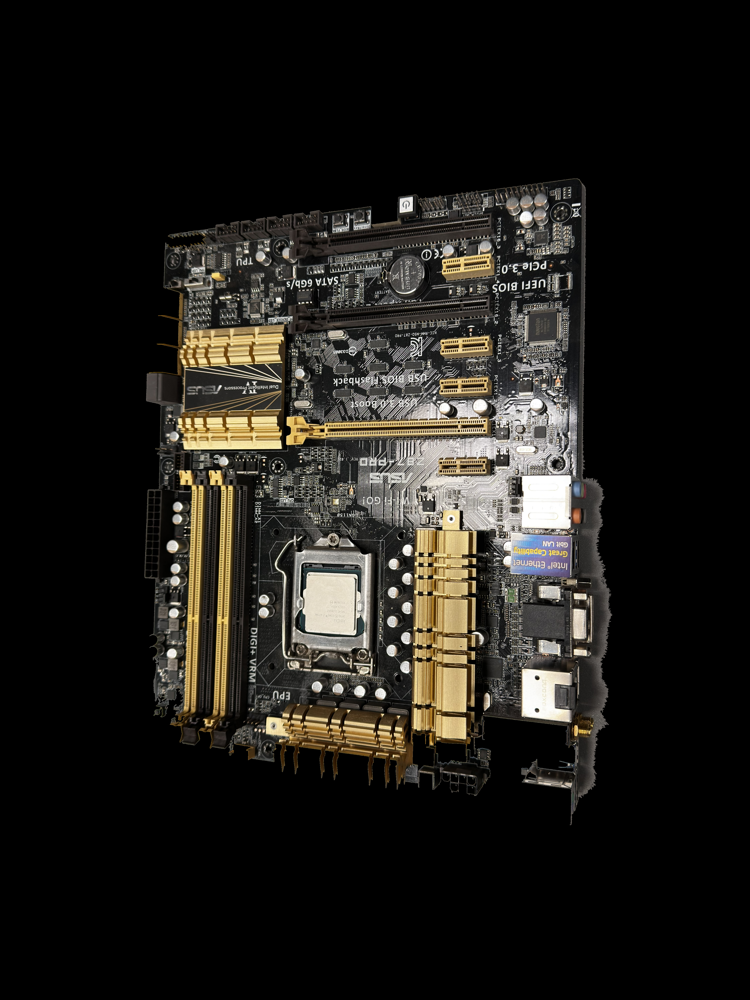

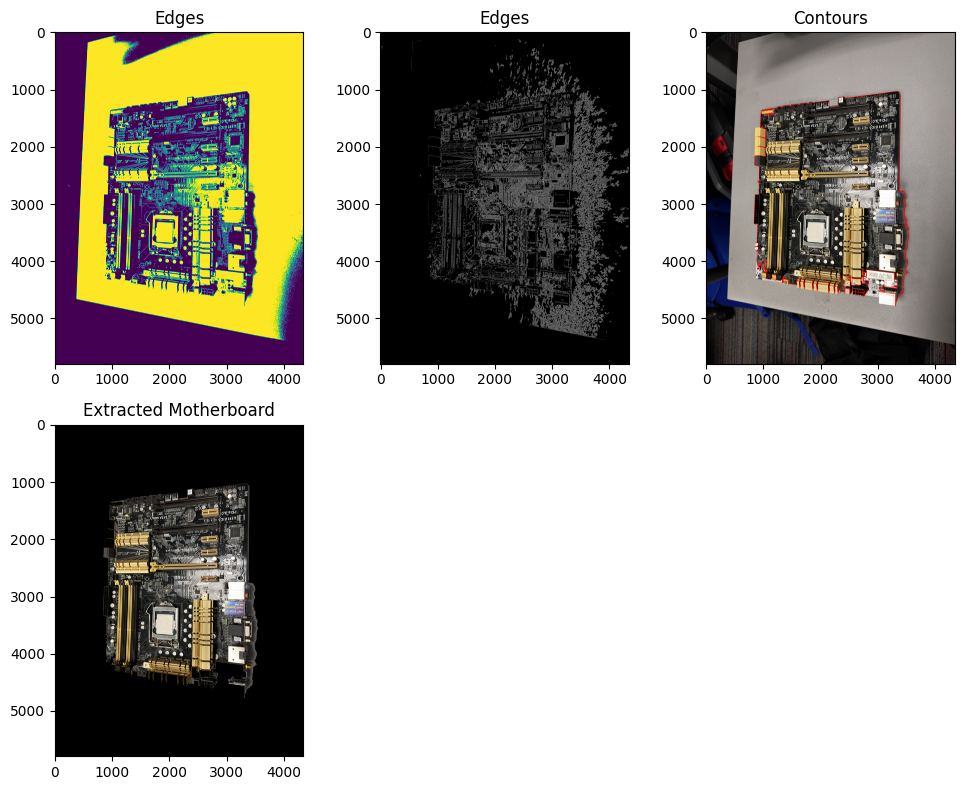

In [9]:
#STEP 1
# Load HD image
image = cv2.imread(motherboard_dir)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

image2 = image

# Thresholding
# You can experiment with the threshold value (e.g., 127) and the max value (e.g., 255)
_, thresholded = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)


# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(thresholded, (5, 5), 1.5)
# Apply Canny edge detection
edges = cv2.Canny(gray, threshold1=10, threshold2=250)

# Contour detection
kernel = np.ones((5, 5), np.uint8)
dilated = cv2.dilate(thresholded, kernel, iterations=1)
contours, _ = cv2.findContours(thresholded, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

max_contour = None
max_area = 0
for contour in contours:
    area = cv2.contourArea(contour)
    x, y, w, h = cv2.boundingRect(contour)
    aspect_ratio = w / float(h)

    # Define size and aspect ratio thresholds (adjust as necessary). the max area limit gets rid of the table underneath the board
    if area > max_area and w > 100 and h > 100 and 0.5 < aspect_ratio < 1.5 and area < 15750000:
        max_area = area
        max_contour = contour

# Filter and draw the largest contour (assuming it's the motherboard)
contour_image = image.copy()
cv2.drawContours(contour_image, [max_contour], -1, (0, 0, 255), 5)

# Mask the motherboard using the largest contour
mask = np.zeros_like(gray)
cv2.drawContours(mask, [max_contour], -1, 255, thickness=cv2.FILLED)
extracted = cv2.bitwise_and(image, image, mask=mask)

# Display results using matplotlib with titles
plt.figure(figsize=(10, 8))

# Show Edges
plt.subplot(2, 3, 1)
plt.imshow(thresholded)
plt.title('Edges')

# Show Edges
plt.subplot(2, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title('Edges')

# Show Contours
plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
plt.title('Contours')

# Show Extracted Motherboard
plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(extracted, cv2.COLOR_BGR2RGB))
plt.title('Extracted Motherboard')

cv2_imshow(extracted)

# Display the plots
plt.tight_layout()
plt.show()


In [ ]:
# STEP 2

# Load the YOLOv8 nano model
model = YOLO('yolov8n.pt')  # 'n' refers to the nano version

# Train the model
model.train(
    data=yaml_dir,  # Path to the data.yaml file
    epochs=100,                # Number of training epochs
    imgsz=1200,                 # Image size for training (default 640)
    batch=16,                  # Batch size (adjust based on your GPU memory)
    device=0                   # Use GPU (set to 'cpu' if no GPU is available)
    name = pcb_dtct_1
)

